### DATA FEATURES
1	credit. policy	it is ‘1’ if the customer meets the credit underwriting criteria of LendingClub.com, and ‘0’ otherwise

2	purpose	The purpose of the loan (takes values "credit_card", "debt_consolidation", "educational", "major_purchase", "small_business", and "all other").

3	int.rate	The interest rate of the loan, proportionate to the amount of riskiness (a rate of 11% would be stored as 0.11). E.g. - Borrowers judged by LendingClub.com to be riskier, are assigned higher interest rates

4	installment	The monthly installments that a borrower owes to the lending company, if the loan is funded.

5	log.annual.inc	The natural log of the self-reported annual income of the borrower.

6	di	The debt-to-income ratio of the borrower (amount of debt divided by annual income).

7	fico	The FICO credit score of the borrower. (FICO is a credit bureau similar to RBI for banks)

8	days.with.cr.line	The number of days the borrower has had a credit line.

9	vol. bal	The borrower's revolving balance (amount unpaid at the end of the credit card billing cycle)

10	vol. util	The borrower's revolving line utilization rate (the amount of the credit line used relative to total credit available).

11	in. last.6 months	The borrower's number of inquiries by creditors in the last 6 months.

12	delinq.2yrs	The number of times the borrower had been 30+ days past due on a payment in the past 2 years.

13	pub.rec	The borrower's number of derogatory public records (bankruptcy filings, tax liens, or judgments).

14	not. fully.paid (Target)	Whether a borrower will fully pay off the loan  or not.



In [18]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

### Firstly this is a SUPERVISED Learning Task

In [19]:
os.chdir(r'C:\Users\63094\Downloads\hero wired\datacsv')
os.listdir()
df=pd.read_csv('Dataset (4).csv')
df


,credit.policy,purpose,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
0,1,debt_consolidation,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0
1,1,credit_card,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,0
2,1,debt_consolidation,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,0
3,1,debt_consolidation,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,0
4,1,credit_card,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9573,0,all_other,0.1461,344.76,12.180755,10.39,672,10474.000000,215372,82.1,2,0,0,1
9574,0,all_other,0.1253,257.70,11.141862,0.21,722,4380.000000,184,1.1,5,0,0,1
9575,0,debt_consolidation,0.1071,97.81,10.596635,13.09,687,3450.041667,10036,82.9,8,0,0,1
9576,0,home_improvement,0.1600,351.58,10.819778,19.18,692,1800.000000,0,3.2,5,0,0,1


In [20]:
pd.crosstab(df['not.fully.paid'],df['credit.policy'])

credit.policy,0,1
not.fully.paid,,
0,1349,6696
1,519,1014


In [21]:
pd.crosstab(df['not.fully.paid'],df['credit.policy'],normalize=True)

credit.policy,0,1
not.fully.paid,,
0,0.140844,0.699102
1,0.054187,0.105868


<AxesSubplot:xlabel='int.rate', ylabel='Count'>

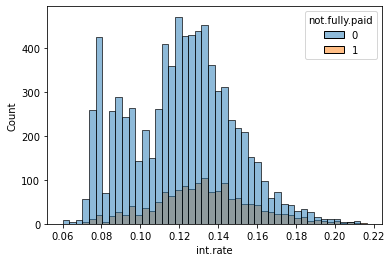

In [22]:
sns.histplot(x='int.rate',hue='not.fully.paid',data=df)

### we interpret that people who didn't meet the credit policy members are not have high rate of not paying loan fully

In [23]:
df['not.fully.paid'].value_counts()

0    8045
1    1533
Name: not.fully.paid, dtype: int64

###  from target variable we clearly say that this is classification problem

In [24]:
df.shape

(9578, 14)

In [25]:
df.columns

Index(['credit.policy', 'purpose', 'int.rate', 'installment', 'log.annual.inc',
       'dti', 'fico', 'days.with.cr.line', 'revol.bal', 'revol.util',
       'inq.last.6mths', 'delinq.2yrs', 'pub.rec', 'not.fully.paid'],
      dtype='object')

# Data exploring

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9578 entries, 0 to 9577
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   credit.policy      9578 non-null   int64  
 1   purpose            9578 non-null   object 
 2   int.rate           9578 non-null   float64
 3   installment        9578 non-null   float64
 4   log.annual.inc     9578 non-null   float64
 5   dti                9578 non-null   float64
 6   fico               9578 non-null   int64  
 7   days.with.cr.line  9578 non-null   float64
 8   revol.bal          9578 non-null   int64  
 9   revol.util         9578 non-null   float64
 10  inq.last.6mths     9578 non-null   int64  
 11  delinq.2yrs        9578 non-null   int64  
 12  pub.rec            9578 non-null   int64  
 13  not.fully.paid     9578 non-null   int64  
dtypes: float64(6), int64(7), object(1)
memory usage: 1.0+ MB


###  we have only one categorical variable...( purpose)

### Null values

In [27]:
df.isnull().sum()

credit.policy        0
purpose              0
int.rate             0
installment          0
log.annual.inc       0
dti                  0
fico                 0
days.with.cr.line    0
revol.bal            0
revol.util           0
inq.last.6mths       0
delinq.2yrs          0
pub.rec              0
not.fully.paid       0
dtype: int64

### unique values

In [28]:
for i in df.columns:
    print(i,'-----',round((df[i].nunique()/df.shape[0])*100,3))

credit.policy ----- 0.021
purpose ----- 0.073
int.rate ----- 2.6
installment ----- 49.99
log.annual.inc ----- 20.745
dti ----- 26.404
fico ----- 0.459
days.with.cr.line ----- 28.054
revol.bal ----- 82.157
revol.util ----- 10.806
inq.last.6mths ----- 0.292
delinq.2yrs ----- 0.115
pub.rec ----- 0.063
not.fully.paid ----- 0.021


### duplicates

In [29]:
df.duplicated().sum()

0

### categorical variable

In [30]:
df['purpose'].value_counts()

debt_consolidation    3957
all_other             2331
credit_card           1262
home_improvement       629
small_business         619
major_purchase         437
educational            343
Name: purpose, dtype: int64

In [31]:
###debt_consolidtaion candidates are more('for clearing debts')

C:\Users\63094\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<Figure size 1296x648 with 0 Axes>

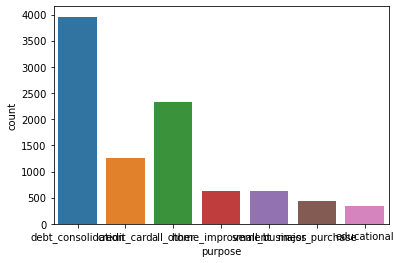

<Figure size 1296x648 with 0 Axes>

In [32]:
sns.countplot(df['purpose']);
plt.figure(figsize=[18,9])

In [33]:
df.describe(include='O')

,purpose
count,9578
unique,7
top,debt_consolidation
freq,3957


### numerical variables

In [34]:
df.describe(percentiles=[0.2,0.85,0.95,0.99])

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
count,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9.578000e+03,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000
mean,0.804970,0.122640,319.089413,10.932117,12.606679,710.846314,4560.767197,1.691396e+04,46.799236,1.577469,0.163708,0.062122,0.160054
std,0.396245,0.026847,207.071301,0.614813,6.883970,37.970537,2496.930377,3.375619e+04,29.014417,2.200245,0.546215,0.262126,0.366676
min,0.000000,0.060000,15.670000,7.547502,0.000000,612.000000,178.958333,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
20%,1.000000,0.096300,143.384000,10.463103,5.930000,677.000000,2504.016667,2.287000e+03,17.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.122100,268.950000,10.928884,12.665000,707.000000,4139.958333,8.596000e+03,46.300000,1.000000,0.000000,0.000000,0.000000
85%,1.000000,0.149600,534.410000,11.512925,20.554500,752.000000,6967.268750,2.684725e+04,81.700000,3.000000,0.000000,0.000000,1.000000
95%,1.000000,0.167000,756.265500,11.918391,23.650000,782.000000,9329.958333,5.765430e+04,94.000000,5.000000,1.000000,1.000000,1.000000
99%,1.000000,0.188600,870.390000,12.484574,26.242300,802.000000,12930.009584,1.567626e+05,98.923000,9.000000,2.230000,1.000000,1.000000
max,1.000000,0.216400,940.140000,14.528354,29.960000,827.000000,17639.958330,1.207359e+06,119.000000,33.000000,13.000000,5.000000,1.000000


In [35]:
df['days.with.cr.line'].describe()

count     9578.000000
mean      4560.767197
std       2496.930377
min        178.958333
25%       2820.000000
50%       4139.958333
75%       5730.000000
max      17639.958330
Name: days.with.cr.line, dtype: float64

In [36]:
import warnings
warnings.filterwarnings(action='ignore')

<AxesSubplot:xlabel='days.with.cr.line'>

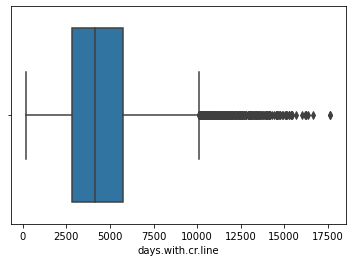

In [37]:
sns.boxplot(df['days.with.cr.line'])

In [38]:
q1=df['days.with.cr.line'].quantile(0.25)
q3=df['days.with.cr.line'].quantile(0.75)
iqr=q3-q1
iqr

2910.0

In [39]:
ll=q1-3*iqr
ul=q3+3*iqr
ll,ul

(-5910.0, 14460.0)

### by extreme outliers

## exploring each variable(univariate)

In [40]:
df

,credit.policy,purpose,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
0,1,debt_consolidation,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0
1,1,credit_card,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,0
2,1,debt_consolidation,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,0
3,1,debt_consolidation,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,0
4,1,credit_card,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9573,0,all_other,0.1461,344.76,12.180755,10.39,672,10474.000000,215372,82.1,2,0,0,1
9574,0,all_other,0.1253,257.70,11.141862,0.21,722,4380.000000,184,1.1,5,0,0,1
9575,0,debt_consolidation,0.1071,97.81,10.596635,13.09,687,3450.041667,10036,82.9,8,0,0,1
9576,0,home_improvement,0.1600,351.58,10.819778,19.18,692,1800.000000,0,3.2,5,0,0,1


###credit policy

<AxesSubplot:xlabel='credit.policy', ylabel='count'>

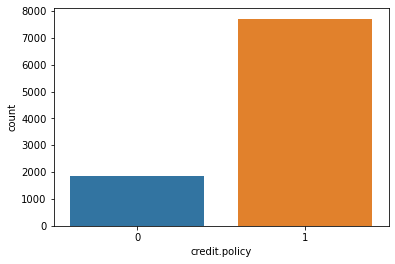

In [41]:
sns.countplot(df['credit.policy'])

In [42]:
df['credit.policy'].value_counts()

1    7710
0    1868
Name: credit.policy, dtype: int64

### (int.rate)

In [43]:
df['int.rate'].value_counts()

0.1253    354
0.0894    299
0.1183    243
0.1218    215
0.0963    210
         ... 
0.1756      1
0.1741      1
0.1772      1
0.1746      1
0.1941      1
Name: int.rate, Length: 249, dtype: int64

<AxesSubplot:xlabel='int.rate', ylabel='Count'>

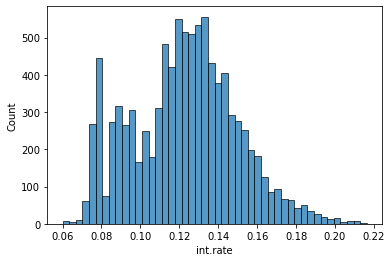

In [44]:
sns.histplot(df['int.rate'])

In [45]:
###MORE MEMBERS HAVE INTEREST RATE FROM 0.12 PAISA TO 0.15 PAISA

### installment

<AxesSubplot:xlabel='installment', ylabel='Density'>

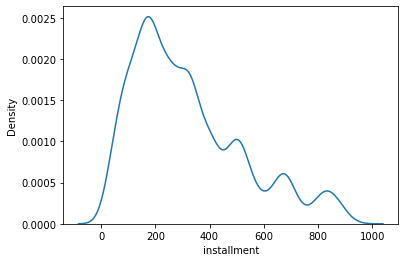

In [46]:
sns.kdeplot(df['installment'])

In [47]:
###most customers have paying installments from 100 to 400

### log.annual.inc

<AxesSubplot:xlabel='log.annual.inc', ylabel='Count'>

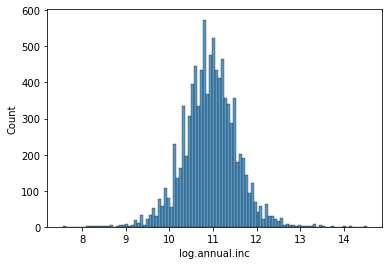

In [48]:
sns.histplot(df['log.annual.inc'])

In [49]:
### mostly members annual income is from 10 to 12

### debt/income

<AxesSubplot:xlabel='dti', ylabel='Count'>

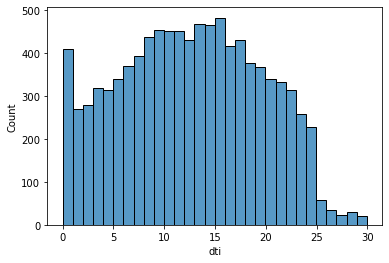

In [50]:
sns.histplot(df['dti'])

In [51]:
## example for if a person has 10000 debt then lets assuume his annual income will be 2000 then dti=5
## members have d/i ratio ranging from 1 to 30 

### fico(credit score)

<AxesSubplot:xlabel='fico', ylabel='Count'>

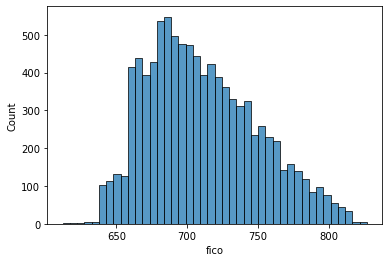

In [52]:
sns.histplot(df['fico'])

### days.with.credit.line	

In [53]:
df['year.with.cr.line']=df['days.with.cr.line']/365
###converting days into years
df.drop(labels=['days.with.cr.line'],axis=1,inplace=True)
##dropping the days.with.cr.line


<AxesSubplot:xlabel='year.with.cr.line', ylabel='Count'>

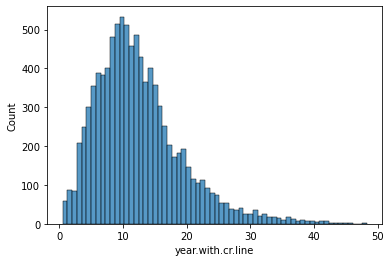

In [54]:
sns.histplot(df['year.with.cr.line'])

In [55]:
###most members repayment years  is from 0-20

### revol.bal

<AxesSubplot:xlabel='revol.bal', ylabel='Density'>

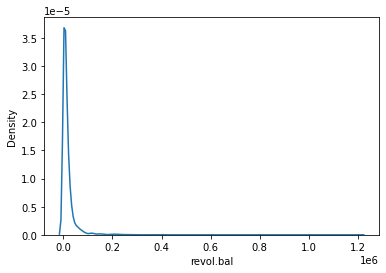

In [56]:
sns.kdeplot(df['revol.bal'])

### revol.util

<AxesSubplot:xlabel='revol.util', ylabel='Count'>

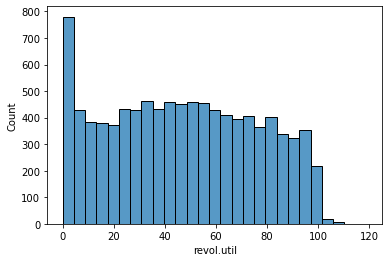

In [57]:
sns.histplot(df['revol.util'])

### inq.last.6mths

<AxesSubplot:xlabel='inq.last.6mths', ylabel='count'>

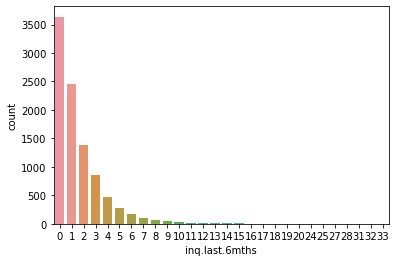

In [58]:
sns.countplot(df['inq.last.6mths'])

### delinq.2yrs

<AxesSubplot:xlabel='delinq.2yrs', ylabel='count'>

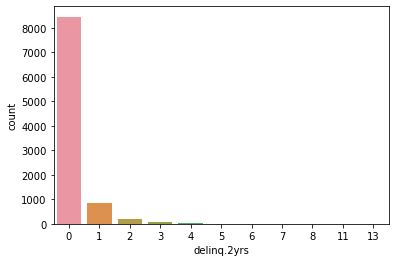

In [59]:
sns.countplot(df['delinq.2yrs'])

### pub.rec

<AxesSubplot:xlabel='pub.rec', ylabel='count'>

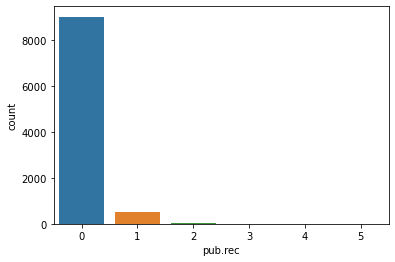

In [60]:
 sns.countplot(df['pub.rec'])

### target one

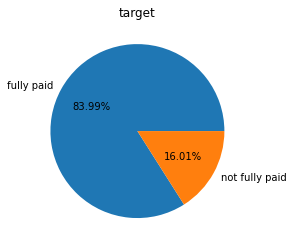

In [61]:
d=df['not.fully.paid'].value_counts( )
d
d=df['not.fully.paid'].value_counts( normalize=True)
plt.pie(d,labels=['fully paid','not fully paid'],autopct='%1.2f%%')
plt.title('target')
plt.show()


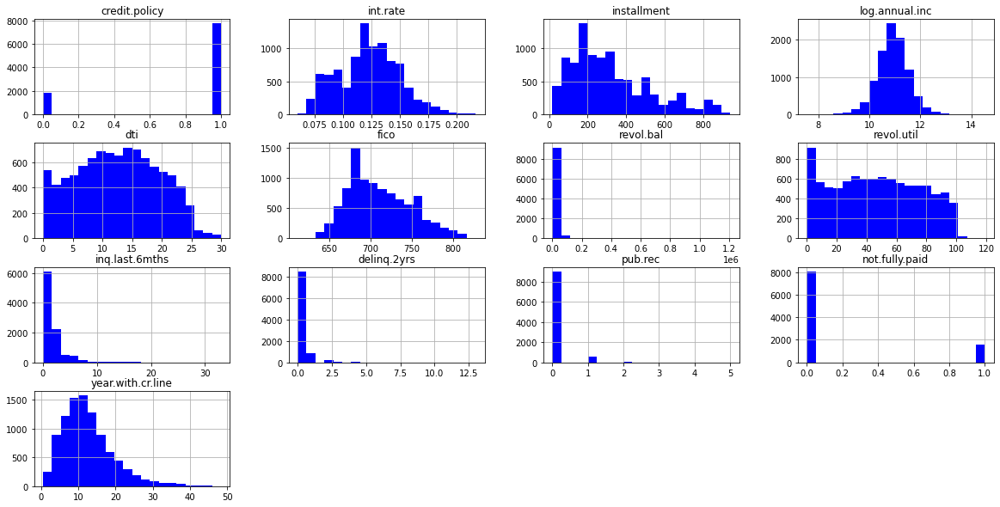

In [62]:
df.hist(bins = 20, figsize = (20,10), color = 'b');

### lets our asses begin....

### firstly rename the names

In [63]:
df.columns

Index(['credit.policy', 'purpose', 'int.rate', 'installment', 'log.annual.inc',
       'dti', 'fico', 'revol.bal', 'revol.util', 'inq.last.6mths',
       'delinq.2yrs', 'pub.rec', 'not.fully.paid', 'year.with.cr.line'],
      dtype='object')

In [64]:
df1=df.rename(columns={'int.rate':'interestrate','log.annual.inc':'annual income','dti':'debts/income','fico':'creditscore','revolbal':'amount unpaid at end','delinq.2yrs':'due','pub.rec':'public_record', 'not.fully.paid':'target','inq.last.6mths':'enquiry'})


In [65]:
df1

,credit.policy,purpose,interestrate,installment,annual income,debts/income,creditscore,revol.bal,revol.util,enquiry,due,public_record,target,year.with.cr.line
0,1,debt_consolidation,0.1189,829.10,11.350407,19.48,737,28854,52.1,0,0,0,0,15.451941
1,1,credit_card,0.1071,228.22,11.082143,14.29,707,33623,76.7,0,0,0,0,7.561644
2,1,debt_consolidation,0.1357,366.86,10.373491,11.63,682,3511,25.6,1,0,0,0,12.904110
3,1,debt_consolidation,0.1008,162.34,11.350407,8.10,712,33667,73.2,1,0,0,0,7.397146
4,1,credit_card,0.1426,102.92,11.299732,14.97,667,4740,39.5,0,1,0,0,11.139726
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9573,0,all_other,0.1461,344.76,12.180755,10.39,672,215372,82.1,2,0,0,1,28.695890
9574,0,all_other,0.1253,257.70,11.141862,0.21,722,184,1.1,5,0,0,1,12.000000
9575,0,debt_consolidation,0.1071,97.81,10.596635,13.09,687,10036,82.9,8,0,0,1,9.452169
9576,0,home_improvement,0.1600,351.58,10.819778,19.18,692,0,3.2,5,0,0,1,4.931507


# Bivariate Analysis

<AxesSubplot:xlabel='purpose', ylabel='count'>

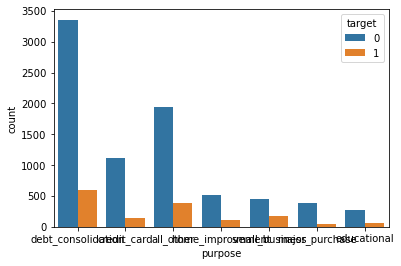

In [66]:
sns.countplot(x=df1['purpose'],hue=df1['target'],orient='horizantal')

### relation  plot(corr)

<Figure size 936x1728 with 0 Axes>

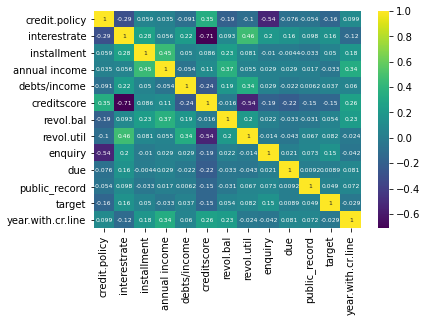

<Figure size 936x1728 with 0 Axes>

In [67]:
sns.heatmap(df1.corr(),cmap='viridis',annot=True,annot_kws={"size":6})
plt.figure(figsize=(13,24))

In [68]:
 ##we noticed some relation between  interest rate and credit score(0.71)

<AxesSubplot:xlabel='credit.policy', ylabel='count'>

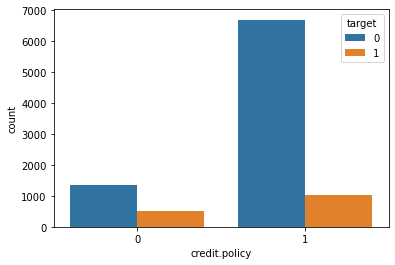

In [69]:
sns.countplot(x=df1['credit.policy'],hue=df1['target'])

<AxesSubplot:xlabel='enquiry', ylabel='count'>

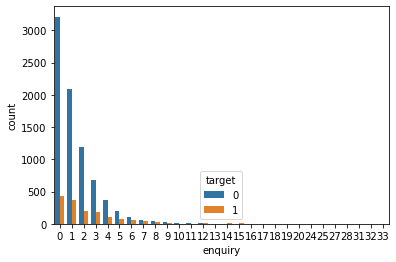

In [70]:
sns.countplot(x=df1['enquiry'],hue=df1['target'])

<AxesSubplot:xlabel='due', ylabel='count'>

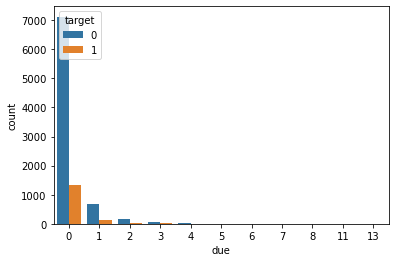

In [71]:
sns.countplot(x=df1['due'],hue=df1['target'])

<AxesSubplot:xlabel='public_record', ylabel='count'>

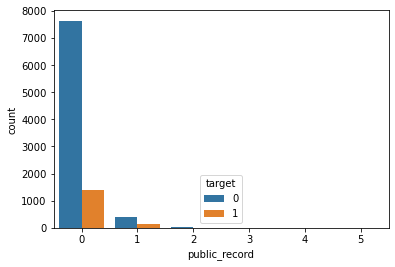

In [72]:
sns.countplot(x=df1['public_record'],hue=df1['target'])

<AxesSubplot:xlabel='target', ylabel='interestrate'>

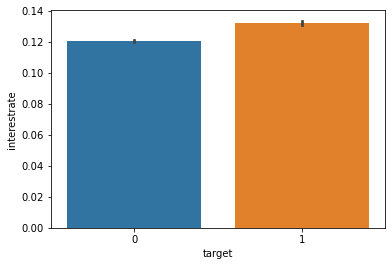

In [73]:
sns.barplot(y=df1['interestrate'],x=df1['target'])

<AxesSubplot:xlabel='target', ylabel='installment'>

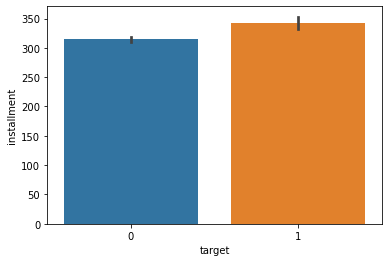

In [74]:
sns.barplot(y=df1['installment'],x=df1['target'])

### frequency for purposes

In [75]:
pd.crosstab(df1.target, df1.purpose)

purpose,all_other,credit_card,debt_consolidation,educational,home_improvement,major_purchase,small_business
target,,,,,,,
0,1944,1116,3354,274,522,388,447
1,387,146,603,69,107,49,172


<AxesSubplot:xlabel='target'>

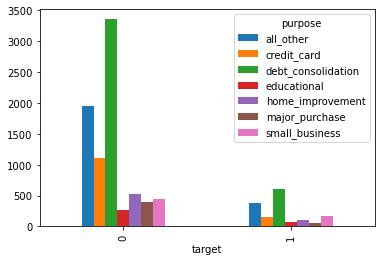

In [76]:
pd.crosstab(df1.target, df1.purpose).plot(kind='bar')

### debt consolidations

In [77]:
df1

,credit.policy,purpose,interestrate,installment,annual income,debts/income,creditscore,revol.bal,revol.util,enquiry,due,public_record,target,year.with.cr.line
0,1,debt_consolidation,0.1189,829.10,11.350407,19.48,737,28854,52.1,0,0,0,0,15.451941
1,1,credit_card,0.1071,228.22,11.082143,14.29,707,33623,76.7,0,0,0,0,7.561644
2,1,debt_consolidation,0.1357,366.86,10.373491,11.63,682,3511,25.6,1,0,0,0,12.904110
3,1,debt_consolidation,0.1008,162.34,11.350407,8.10,712,33667,73.2,1,0,0,0,7.397146
4,1,credit_card,0.1426,102.92,11.299732,14.97,667,4740,39.5,0,1,0,0,11.139726
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9573,0,all_other,0.1461,344.76,12.180755,10.39,672,215372,82.1,2,0,0,1,28.695890
9574,0,all_other,0.1253,257.70,11.141862,0.21,722,184,1.1,5,0,0,1,12.000000
9575,0,debt_consolidation,0.1071,97.81,10.596635,13.09,687,10036,82.9,8,0,0,1,9.452169
9576,0,home_improvement,0.1600,351.58,10.819778,19.18,692,0,3.2,5,0,0,1,4.931507


In [78]:
import hvplot.pandas

In [79]:
 df1.hvplot.hist(y='interestrate', by='target', alpha=0.3)


:NdOverlay   [target]
   :Histogram   [interestrate]   (interestrate_count)

### less interest guys have cleared their loans 

In [80]:
df1.hvplot.hist(y='annual income', by='target', bins=50, alpha=0.3)


:NdOverlay   [target]
   :Histogram   [annual income]   (annual income_count)

In [81]:
df1.hvplot.hist(y='creditscore', by='target', bins=50, alpha=0.3)

:NdOverlay   [target]
   :Histogram   [creditscore]   (creditscore_count)

### we seethat high credit score members have fully paid

In [82]:
df1.hvplot.hist(y='debts/income', by='target', bins=50, alpha=0.3)

:NdOverlay   [target]
   :Histogram   [debts/income]   (debts/income_count)

### d/i ratio will always be low for repaying

In [83]:

df1.hvplot.hist(y='revol.bal', by='target', bins=50, alpha=0.3)


:NdOverlay   [target]
   :Histogram   [revol.bal]   (revol.bal_count)

<AxesSubplot:xlabel='installment', ylabel='annual income'>

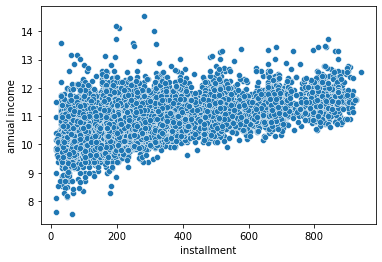

In [84]:
sns.scatterplot(x='installment',y='annual income',data=df1)

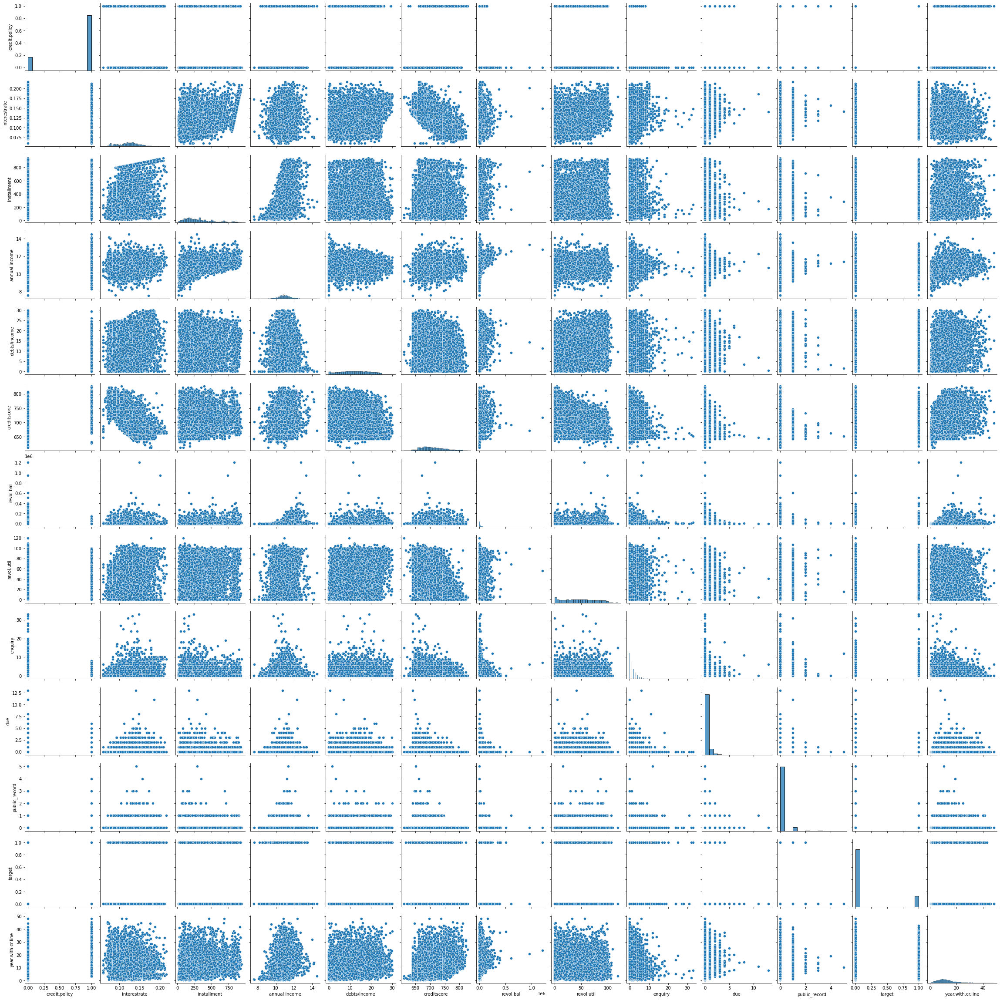

In [85]:
sns.pairplot(df1)

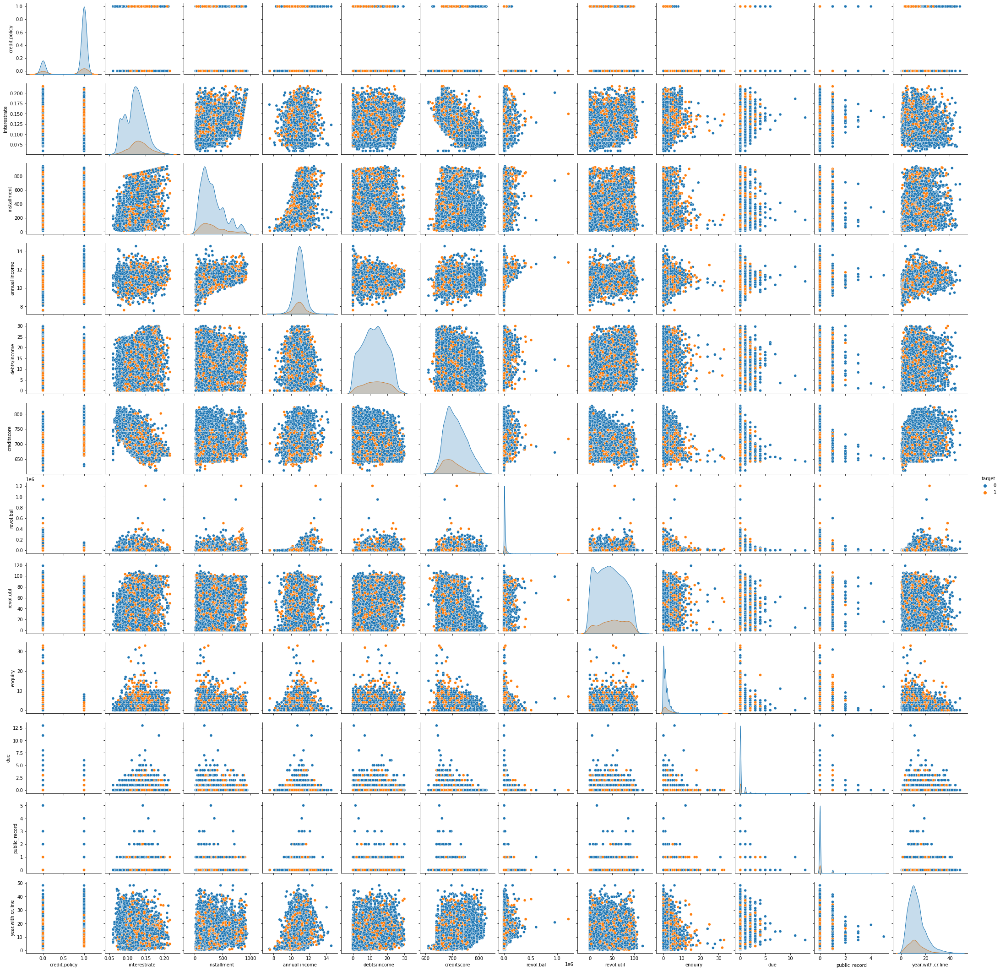

In [86]:
sns.pairplot(df1,hue='target') 

### spltiing the data for modelling

In [87]:
from sklearn.model_selection import train_test_split
x=df1.drop(['target'],axis=1)
y=df1['target']

In [88]:
df['purpose'].value_counts()

debt_consolidation    3957
all_other             2331
credit_card           1262
home_improvement       629
small_business         619
major_purchase         437
educational            343
Name: purpose, dtype: int64

### firstly we see that our categorical variable is nominal one ...then we apply
1.pd.get dummies
2.one hot encoding

### encode the training dataset

In [89]:
 x_encoded_s=pd.get_dummies(x,columns=['purpose'],drop_first=True)
x_encoded_s

,credit.policy,interestrate,installment,annual income,debts/income,creditscore,revol.bal,revol.util,enquiry,due,public_record,year.with.cr.line,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_major_purchase,purpose_small_business
0,1,0.1189,829.10,11.350407,19.48,737,28854,52.1,0,0,0,15.451941,0,1,0,0,0,0
1,1,0.1071,228.22,11.082143,14.29,707,33623,76.7,0,0,0,7.561644,1,0,0,0,0,0
2,1,0.1357,366.86,10.373491,11.63,682,3511,25.6,1,0,0,12.904110,0,1,0,0,0,0
3,1,0.1008,162.34,11.350407,8.10,712,33667,73.2,1,0,0,7.397146,0,1,0,0,0,0
4,1,0.1426,102.92,11.299732,14.97,667,4740,39.5,0,1,0,11.139726,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9573,0,0.1461,344.76,12.180755,10.39,672,215372,82.1,2,0,0,28.695890,0,0,0,0,0,0
9574,0,0.1253,257.70,11.141862,0.21,722,184,1.1,5,0,0,12.000000,0,0,0,0,0,0
9575,0,0.1071,97.81,10.596635,13.09,687,10036,82.9,8,0,0,9.452169,0,1,0,0,0,0
9576,0,0.1600,351.58,10.819778,19.18,692,0,3.2,5,0,0,4.931507,0,0,0,1,0,0


   ### we use pd.get_dummies

### we also convert the categorical to count  stats as per becase we have different values in categorical

In [94]:
from sklearn.ensemble import ExtraTreesClassifier
mo=ExtraTreesClassifier()
mo.fit(x_encoded_s,y)
print(mo.feature_importances_)

[0.02160234 0.10542818 0.10346293 0.10291493 0.09945324 0.09613961
 0.10094005 0.10207646 0.07192656 0.02764373 0.01531394 0.10086054
 0.00666715 0.01493909 0.00693782 0.00874019 0.00623567 0.00871757]


In [95]:
xtrain,xtest,ytrain,ytest=train_test_split(x_encoded_s,y,test_size=0.25)

### model selection

In [96]:
from sklearn import tree
model=tree.DecisionTreeClassifier( criterion='gini')

In [126]:
model.fit(xtrain,ytrain)

DecisionTreeClassifier()

In [98]:
model.score(xtest,ytest)

0.7419624217118997

In [99]:
model.score(xtrain,ytrain)

1.0

# these are the important features or variable of the dataset

In [100]:
print(model.feature_importances_)

[0.02126267 0.10152835 0.11628112 0.10048087 0.12075118 0.06596796
 0.12082604 0.12292463 0.0390066  0.01549304 0.01146959 0.11968715
 0.00759706 0.01574614 0.00650699 0.00418759 0.00367542 0.00660759]


<function matplotlib.pyplot.show(close=None, block=None)>

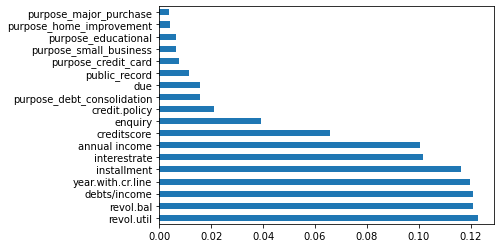

In [103]:
feature_importance=pd.Series(model.feature_importances_,index=x_encoded_s.columns)
feature_importance.nlargest(19).plot(kind='barh')
plt.show

In [106]:
from sklearn.model_selection import cross_val_score
c=cross_val_score(model,x_encoded_s,y,cv=10)
c.mean()

0.7100320024083612

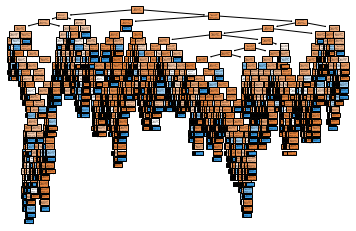

In [107]:
tree.plot_tree(model,filled=True,);

### train

In [108]:
y_pred_train=model.predict(xtrain)

In [140]:
from sklearn.metrics import classification_report,confusion_matrix,roc_auc_score,accuracy_score,precision_score,recall_score,f1_score
cm_train=confusion_matrix(ytrain,y_pred_train)
cm_train

array([[6043,    0],
       [   0, 1140]], dtype=int64)

<AxesSubplot:>

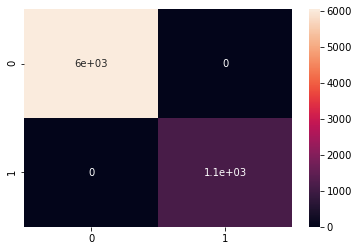

In [110]:
sns.heatmap(cm_train,annot=True)

In [111]:
b=classification_report(ytrain,y_pred_train)
print(b)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      6043
           1       1.00      1.00      1.00      1140

    accuracy                           1.00      7183
   macro avg       1.00      1.00      1.00      7183
weighted avg       1.00      1.00      1.00      7183



### test

In [112]:
from sklearn.metrics import classification_report,confusion_matrix,roc_auc_score
y_pred=model.predict(xtest)

In [113]:
cm=confusion_matrix(ytest,y_pred)
cm

array([[1673,  329],
       [ 289,  104]], dtype=int64)

<AxesSubplot:>

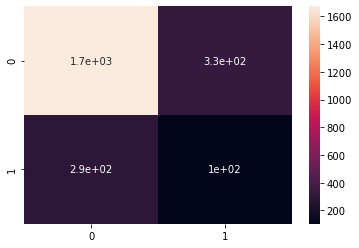

In [114]:
sns.heatmap(cm,annot=True)

In [115]:
b=classification_report(ytest,y_pred)
print(b)

              precision    recall  f1-score   support

           0       0.85      0.84      0.84      2002
           1       0.24      0.26      0.25       393

    accuracy                           0.74      2395
   macro avg       0.55      0.55      0.55      2395
weighted avg       0.75      0.74      0.75      2395



### predict_probability

In [137]:
p_p=model.predict_proba(xtest)
au=p_p[:,1]##positive prediction
print(p_p[:,0])
A=p_p
y_pred_r=model.predict(xtest)
y_pred_r

[1. 1. 1. ... 1. 1. 1.]


array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [128]:
from sklearn.metrics import roc_curve,auc
from sklearn.metrics import roc_curve 

### AUC CURVE

In [131]:
fpr,tpr,thresholds =roc_curve(ytest,au)

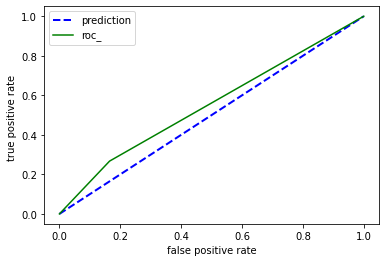

In [132]:
fpr,tpr,thresholds =roc_curve(ytest,au)
plt.plot([0,1],[0,1],color='blue',label='prediction',linewidth=2,linestyle='--')
plt.xlabel('false positive rate')
plt.plot(fpr,tpr ,color='green',label='roc_')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate ')
plt.legend()
plt.show()

In [134]:
print(roc_auc_score(ytest,au))

0.5511702038419596


In [141]:
def evaluate_preds(ytest, y_pred_r):
    """
    Performs evaluation comparison on y_true labels vs. y_pred labels.
    """
    accuracy = accuracy_score(ytest, y_pred_r)
    precision = precision_score(ytest, y_pred_r)
    recall = recall_score(ytest, y_pred_r)
    f1 = f1_score(ytest, y_pred_r)
    metric_dict = {"accuracy": round(accuracy, 2),
                   "precision": round(precision, 2), 
                   "recall": round(recall, 2),
                   "f1": round(f1, 2)}
    print(f"Acc: {accuracy * 100:.2f}%")
    print(f"Precision: {precision:.2f}")
    print(f"Recall: {recall:.2f}")
    print(f"F1 score: {f1:.2f}")

    return metric_dict

In [142]:
base_model = evaluate_preds(ytest, y_pred_r)

Acc: 74.20%
Precision: 0.24
Recall: 0.27
F1 score: 0.25


### we seeeethat data is unbalanced

### to get rid of unbalanced data

In [143]:
from imblearn import over_sampling,under_sampling
from imblearn.over_sampling import RandomOverSampler

In [145]:
ros=RandomOverSampler( random_state=23)
x_rs,y_rs=ros.fit_resample(x_encoded_s,y)
x_train,x_test,y_train,y_test=train_test_split(x_rs,y_rs,test_size=0.25)
y_pred_train_rs=model.predict(x_train)

In [146]:
cm_rs=confusion_matrix(y_train,y_pred_train_rs)
cm_rs

array([[5746,  246],
       [1179, 4896]], dtype=int64)

<AxesSubplot:>

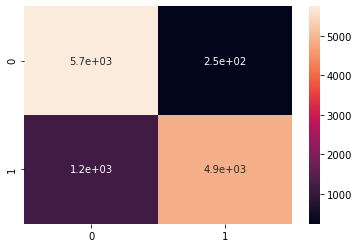

In [147]:
sns.heatmap(cm_rs,annot=True)

In [148]:
y_pred_train_rs=model.predict(x_train)
c=classification_report(y_train,y_pred_train_rs)
print(c)

              precision    recall  f1-score   support

           0       0.83      0.96      0.89      5992
           1       0.95      0.81      0.87      6075

    accuracy                           0.88     12067
   macro avg       0.89      0.88      0.88     12067
weighted avg       0.89      0.88      0.88     12067



### test

In [149]:
y_pred_rs=model.predict(x_test)
c=classification_report(y_test,y_pred_rs)
print(c)

              precision    recall  f1-score   support

           0       0.84      0.96      0.89      2053
           1       0.95      0.81      0.87      1970

    accuracy                           0.88      4023
   macro avg       0.89      0.88      0.88      4023
weighted avg       0.89      0.88      0.88      4023



In [150]:
cm_rs=confusion_matrix(y_test,y_pred_rs)
cm_rs

array([[1969,   84],
       [ 383, 1587]], dtype=int64)

### now these are to be balanced

## for incresing the precision ,recall we prune the tree 

## post pruning

In [151]:
model=tree.DecisionTreeClassifier(ccp_alpha=0.0)
###its defualt is o for giving better alpha our model should be increased
###firstly we take best alpha value

In [152]:
path=model.cost_complexity_pruning_path(x_train,y_train)
path
ccp_alphas=path.ccp_alphas
ccp_alphas;

In [153]:
l=[]
for k in ccp_alphas:
    model_p=tree.DecisionTreeClassifier(ccp_alpha=k,random_state=0)
    model_p.fit(x_train,y_train)
    l.append(model_p)### we are taking alpha for every in decision tree

In [154]:
test_scores=[model_p.score(x_test,y_test) for model_p in l]
test_scores;

In [155]:
train_scores=[model_p.score(x_train,y_train) for model_p in l]
train_scores;

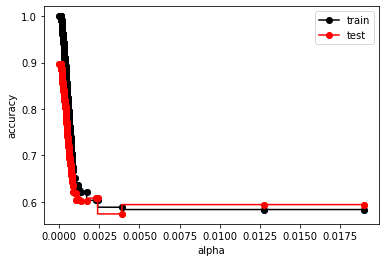

In [156]:

plt.scatter(ccp_alphas,train_scores)
plt.scatter(ccp_alphas,test_scores)
plt.plot(ccp_alphas,train_scores,color='black',marker='o',label='train',drawstyle='steps')
plt.plot(ccp_alphas,test_scores,color='red',marker='o',label='test',drawstyle='steps')
plt.xlabel('alpha')
plt.ylabel('accuracy')
plt.legend()
plt.subplots
plt.show()


In [157]:
after_p=tree.DecisionTreeClassifier(ccp_alpha=0.0001)
after_p.fit(x_train,y_train)

DecisionTreeClassifier(ccp_alpha=0.0001)

### train

In [158]:
y_pred_ap=after_p.predict(x_train)
y_pred_ap
b=classification_report(y_train,y_pred_ap)
print(b)

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      5992
           1       0.99      1.00      0.99      6075

    accuracy                           0.99     12067
   macro avg       0.99      0.99      0.99     12067
weighted avg       0.99      0.99      0.99     12067



[[5943   49]
 [  17 6058]]


Text(33.0, 0.5, 'predicted')

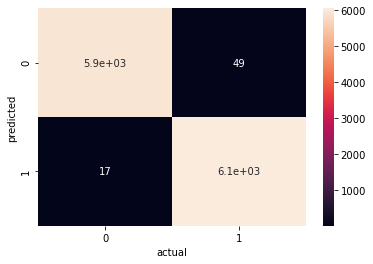

In [159]:
m=confusion_matrix(y_train,y_pred_ap)
print(m)
sns.heatmap(m, annot=True,robust=True)
plt.xlabel('actual')
plt.ylabel('predicted')

### test

In [160]:
y_pred_ap=after_p.predict(x_test)
y_pred_ap
b=classification_report(y_test,y_pred_ap)
print(b)

              precision    recall  f1-score   support

           0       0.98      0.80      0.88      2053
           1       0.82      0.98      0.89      1970

    accuracy                           0.89      4023
   macro avg       0.90      0.89      0.89      4023
weighted avg       0.90      0.89      0.89      4023



In [ ]:
#### its lesss complex than before

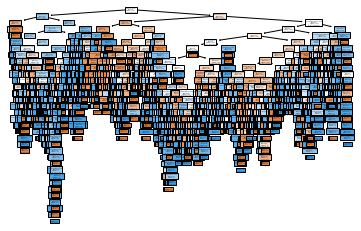

In [162]:
tree.plot_tree(after_p,filled=True,feature_names=x_encoded_s.columns);

[[1639  414]
 [  42 1928]]


Text(33.0, 0.5, 'predicted')

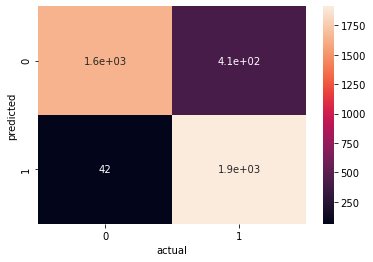

In [163]:
m=confusion_matrix(y_test,y_pred_ap)
print(m)
sns.heatmap(m, annot=True,robust=True)
plt.xlabel('actual')
plt.ylabel('predicted')

In [164]:
#tp=1607
#tn=1924
#fp=437
#fn=54

### ROC-AUC CURVE

In [165]:
from sklearn.metrics import roc_curve,auc
from sklearn.metrics import roc_curve
y_pred_roc=after_p.predict_proba(x_test)
y_pred_roc_pos=y_pred_roc[:,1]##taking positive probabilities
y_pred_roc_pos

array([0.        , 0.96774194, 1.        , ..., 1.        , 1.        ,
       0.        ])

In [166]:
fpr,tpr,thresholds =roc_curve(y_test,y_pred_roc_pos)

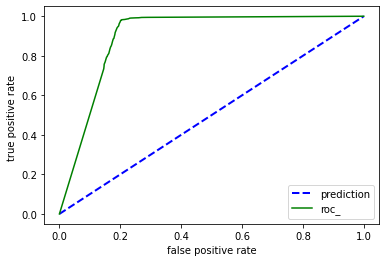

In [167]:
fpr,tpr,thresholds =roc_curve(y_test,y_pred_roc_pos)
plt.plot([0,1],[0,1],color='blue',label='prediction',linewidth=2,linestyle='--')
plt.xlabel('false positive rate')
plt.plot(fpr,tpr ,color='green',label='roc_')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate ')
plt.legend()
plt.show()

In [168]:
from sklearn.metrics import  roc_auc_score,auc
print(roc_auc_score(y_test,y_pred_roc_pos))
print(auc(fpr,tpr))

0.8975430285257923
0.8975430285257923


In [169]:
###larger area means better model(area under curve)

In [173]:
def evaluate_preds(y_test, y_pred_ap):
    """
    Performs evaluation comparison on y_true labels vs. y_pred labels.
    """
    accuracy = accuracy_score(y_test, y_pred_ap)
    precision = precision_score(y_test, y_pred_ap)
    recall = recall_score(y_test, y_pred_ap)
    f1 = f1_score(y_test, y_pred_ap)
    metric_dict = {"accuracy": round(accuracy, 2),
                   "precision": round(precision, 2), 
                   "recall": round(recall, 2),
                   "f1": round(f1, 2)}
    print(f"Acc: {accuracy * 100:.2f}%")
    print(f"Precision: {precision:.2f}")
    print(f"Recall: {recall:.2f}")
    print(f"F1 score: {f1:.2f}")

    return metric_dict

In [175]:
post_pruning_model = evaluate_preds(y_test, y_pred_ap)

Acc: 88.67%
Precision: 0.82
Recall: 0.98
F1 score: 0.89


### now we can seethat precision ,recall increases some what.................

### again prune the tree using hyperparameters

# pruning

In [176]:
from sklearn.model_selection import GridSearchCV
model_grid=tree.DecisionTreeClassifier(ccp_alpha=0.0001)
grid={'max_depth':range(1,12), 'min_samples_leaf':range(1,15),'min_samples_split':range(2,5,)}
gs=GridSearchCV(model_grid,grid,cv=5) 

In [177]:
 gs.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(ccp_alpha=0.0001),
             param_grid={'max_depth': range(1, 12),
                         'min_samples_leaf': range(1, 15),
                         'min_samples_split': range(2, 5)})

In [178]:
 gs.best_params_

{'max_depth': 11, 'min_samples_leaf': 1, 'min_samples_split': 3}

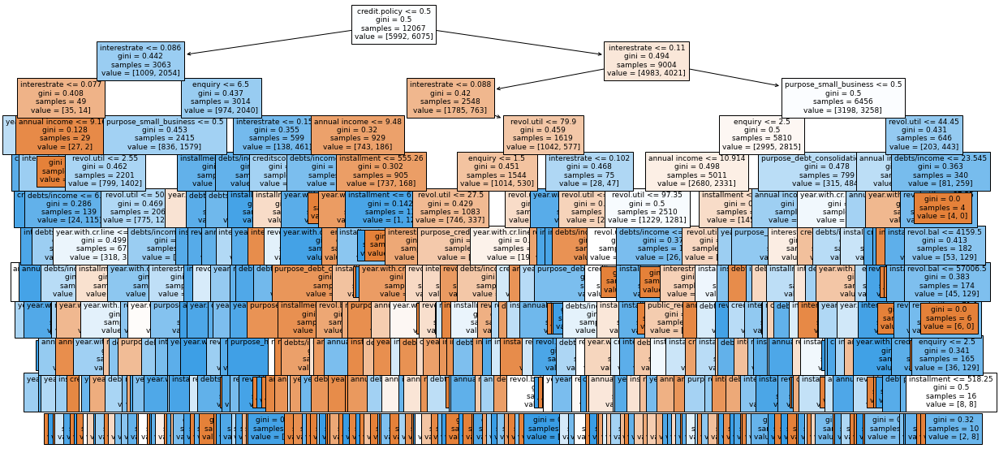

In [180]:
model_grid_best=tree.DecisionTreeClassifier(ccp_alpha=0.0001,max_depth=11, min_samples_leaf=1,min_samples_split=2,criterion='gini')
model_grid_best.fit(x_train,y_train)
fig, axe = plt.subplots(figsize=(20,10))
tree.plot_tree(model_grid_best, filled=True,feature_names=x_encoded_s.columns,ax=axe, fontsize=9);
 

In [181]:
model_grid_best.score(x_train,y_train)

0.7627413607358913

In [182]:
model_grid_best.score(x_test,y_test)

0.6982351478995774

### train

In [183]:
y_pred_g_train=model_grid_best.predict(x_train)
print(classification_report(y_train,y_pred_g_train))

              precision    recall  f1-score   support

           0       0.76      0.77      0.76      5992
           1       0.77      0.76      0.76      6075

    accuracy                           0.76     12067
   macro avg       0.76      0.76      0.76     12067
weighted avg       0.76      0.76      0.76     12067



[[4601 1391]
 [1472 4603]]


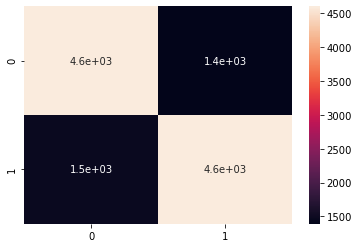

In [184]:
sns.heatmap(confusion_matrix(y_train,y_pred_g_train),annot=True)
a_train=confusion_matrix(y_train,y_pred_g_train)
print(a_train)

### test

In [185]:
y_pred_g=model_grid_best.predict(x_test)
print(classification_report(y_test,y_pred_g))

              precision    recall  f1-score   support

           0       0.71      0.68      0.70      2053
           1       0.68      0.71      0.70      1970

    accuracy                           0.70      4023
   macro avg       0.70      0.70      0.70      4023
weighted avg       0.70      0.70      0.70      4023



[[1403  650]
 [ 564 1406]]


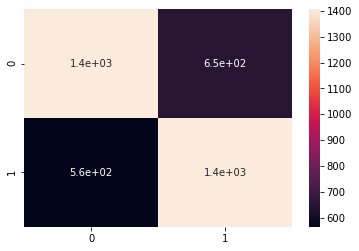

In [186]:
sns.heatmap(confusion_matrix(y_test,y_pred_g),annot=True)
a=confusion_matrix(y_test,y_pred_g)
print(a)

In [187]:
y_pred_roc=model_grid_best.predict_proba(x_test)
y_pred_roc_pos=y_pred_roc[:,1]##taking positive probabilities
y_pred_roc_pos
fpr,tpr,thresholds =roc_curve(y_test,y_pred_roc_pos)

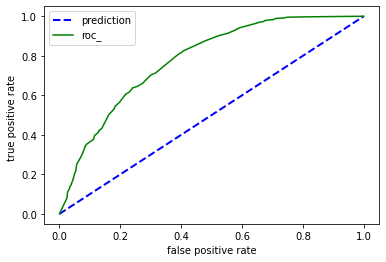

In [188]:
fpr,tpr,thresholds =roc_curve(y_test,y_pred_roc_pos)
plt.plot([0,1],[0,1],color='blue',label='prediction',linewidth=2,linestyle='--')
plt.xlabel('false positive rate')
plt.plot(fpr,tpr ,color='green',label='roc_')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate ')
plt.legend()
plt.show()

In [189]:
from sklearn.metrics import roc_auc_score
roc_auc_score(y_test,y_pred_roc_pos)

0.7785784576736781

In [192]:
def evaluate_preds(y_test, y_pred_g):
    """
    Performs evaluation comparison on y_true labels vs. y_pred labels.
    """
    accuracy = accuracy_score(y_test, y_pred_g)
    precision = precision_score(y_test, y_pred_g)
    recall = recall_score(y_test, y_pred_g)
    f1 = f1_score(y_test, y_pred_g)
    metric_dict = {"accuracy": round(accuracy, 2),
                   "precision": round(precision, 2), 
                   "recall": round(recall, 2),
                   "f1": round(f1, 2)}
    print(f"Acc: {accuracy * 100:.2f}%")
    print(f"Precision: {precision:.2f}")
    print(f"Recall: {recall:.2f}")
    print(f"F1 score: {f1:.2f}")

    return metric_dict

In [229]:
prune_model_grid= evaluate_preds(y_test, y_pred_g)

Acc: 69.82%
Precision: 0.68
Recall: 0.71
F1 score: 0.70


### we check some models then we got some results .......

In [ ]:
 df1

### comaparing our models (plot)

### try subsetting the target and show.....

### apply binning in showing the debts/income,interest rate,

### feature engineering

### creating bins

### concorodance test results

### rank ordering test results.....

### writing scripts for the given questions clearly

m

### modelling with some important variables

In [196]:
x_encoded_upd=x_encoded_s.drop(['purpose_credit_card','purpose_debt_consolidation','purpose_educational','purpose_home_improvement','purpose_major_purchase','purpose_small_business','due','credit.policy','enquiry'],axis=1)
y=df1['target']

In [197]:
x_encoded_upd

,interestrate,installment,annual income,debts/income,creditscore,revol.bal,revol.util,public_record,year.with.cr.line
0,0.1189,829.10,11.350407,19.48,737,28854,52.1,0,15.451941
1,0.1071,228.22,11.082143,14.29,707,33623,76.7,0,7.561644
2,0.1357,366.86,10.373491,11.63,682,3511,25.6,0,12.904110
3,0.1008,162.34,11.350407,8.10,712,33667,73.2,0,7.397146
4,0.1426,102.92,11.299732,14.97,667,4740,39.5,0,11.139726
...,...,...,...,...,...,...,...,...,...
9573,0.1461,344.76,12.180755,10.39,672,215372,82.1,0,28.695890
9574,0.1253,257.70,11.141862,0.21,722,184,1.1,0,12.000000
9575,0.1071,97.81,10.596635,13.09,687,10036,82.9,0,9.452169
9576,0.1600,351.58,10.819778,19.18,692,0,3.2,0,4.931507


In [198]:
X_train,X_test,Y_train,Y_test=train_test_split(x_encoded_upd,y,test_size=0.25)

In [199]:
from sklearn import tree
model_upd_d=tree.DecisionTreeClassifier( criterion='gini')

In [200]:
model_upd_d.fit(X_train,Y_train)

DecisionTreeClassifier()

In [201]:
model_upd_d.score(X_test,Y_test)

0.7306889352818372

In [202]:
model_upd_d.score(X_train,Y_train)

1.0

In [203]:
y_pred_upd=model_upd_d.predict(X_test)
s=classification_report(Y_test,y_pred_upd)
print(s)

              precision    recall  f1-score   support

           0       0.84      0.83      0.84      2003
           1       0.20      0.21      0.20       392

    accuracy                           0.73      2395
   macro avg       0.52      0.52      0.52      2395
weighted avg       0.74      0.73      0.73      2395



In [204]:
ros=RandomOverSampler( random_state=23)
x_rs_upd,y_rs_upd=ros.fit_resample(x_encoded_upd,y)
x_train_upd,x_test_upd,y_train_upd,y_test_upd=train_test_split(x_rs_upd,y_rs_upd,test_size=0.25)
y_pred_rs_upd=model_upd_d.predict(x_test_upd)

In [205]:
s_upd=classification_report(y_test_upd,y_pred_rs_upd)
print(s_upd)

              precision    recall  f1-score   support

           0       0.82      0.96      0.88      2019
           1       0.95      0.78      0.86      2004

    accuracy                           0.87      4023
   macro avg       0.88      0.87      0.87      4023
weighted avg       0.88      0.87      0.87      4023



[[1939   80]
 [ 436 1568]]


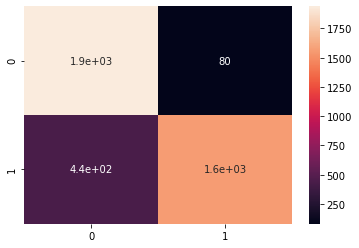

In [206]:
sns.heatmap(confusion_matrix(y_test_upd,y_pred_rs_upd),annot=True)
s_s=confusion_matrix(y_test_upd,y_pred_rs_upd)
print(s_s)

[Text(0.3753065079911161, 0.9848484848484849, 'X[0] <= 0.093\ngini = 0.267\nsamples = 7183\nvalue = [6042, 1141]'),
 Text(0.05245684330868697, 0.9545454545454546, 'X[2] <= 9.258\ngini = 0.103\nsamples = 1267\nvalue = [1198, 69]'),
 Text(0.030088131198093702, 0.9242424242424242, 'X[1] <= 84.64\ngini = 0.486\nsamples = 12\nvalue = [7, 5]'),
 Text(0.02784542874163367, 0.8939393939393939, 'X[1] <= 52.665\ngini = 0.444\nsamples = 6\nvalue = [2, 4]'),
 Text(0.026724077513403652, 0.8636363636363636, 'X[8] <= 1.108\ngini = 0.444\nsamples = 3\nvalue = [2, 1]'),
 Text(0.025602726285173634, 0.8333333333333334, 'gini = 0.0\nsamples = 1\nvalue = [0, 1]'),
 Text(0.02784542874163367, 0.8333333333333334, 'gini = 0.0\nsamples = 2\nvalue = [2, 0]'),
 Text(0.028966779969863687, 0.8636363636363636, 'gini = 0.0\nsamples = 3\nvalue = [0, 3]'),
 Text(0.032330833654553734, 0.8939393939393939, 'X[2] <= 8.843\ngini = 0.278\nsamples = 6\nvalue = [5, 1]'),
 Text(0.03120948242632372, 0.8636363636363636, 'gini = 0.

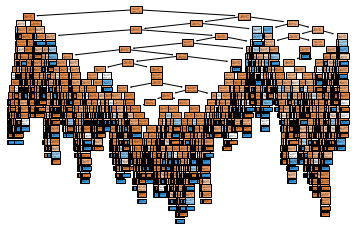

In [209]:
tree.plot_tree(model_upd_d,filled=True)

### see above how decision tree is splitiing

### TUNING USING RANDOMISED SEARCH CV

In [210]:
m=tree.DecisionTreeClassifier(criterion='gini')
rs_rf = RandomizedSearchCV(m, 
                           param_distributions=grid,
                           cv=5,
                           n_iter=20,
                           verbose=True)

<IPython.core.display.Javascript object>

In [211]:
rs_rf

RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_iter=20,
                   param_distributions={'max_depth': range(1, 12),
                                        'min_samples_leaf': range(1, 15),
                                        'min_samples_split': range(2, 5)},
                   verbose=True)

In [212]:
rs_rf.fit(x_train,y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_iter=20,
                   param_distributions={'max_depth': range(1, 12),
                                        'min_samples_leaf': range(1, 15),
                                        'min_samples_split': range(2, 5)},
                   verbose=True)

In [213]:
rs_rf.best_params_

{'min_samples_split': 3, 'min_samples_leaf': 5, 'max_depth': 10}

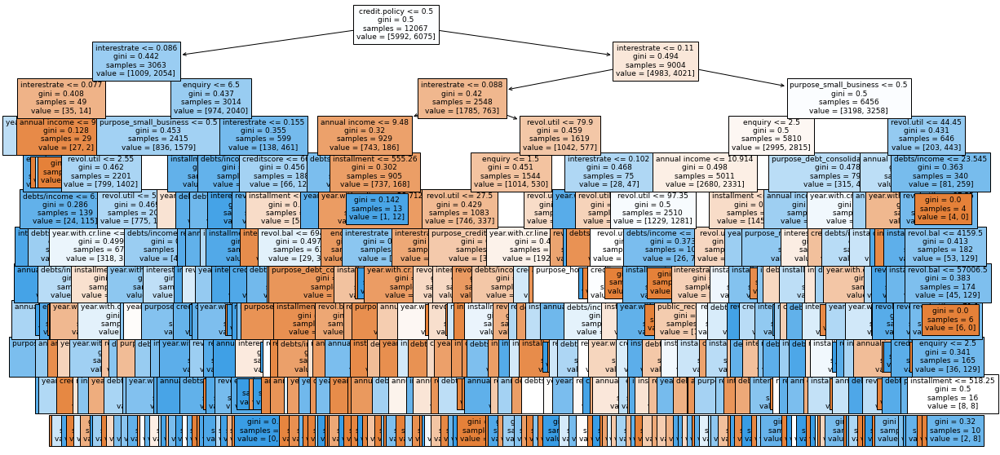

In [215]:
model_grid_rcv=tree.DecisionTreeClassifier(ccp_alpha=0.0001,max_depth=11, min_samples_leaf=2,min_samples_split=3,criterion='gini')
model_grid_rcv.fit(x_train,y_train)
fig, axe = plt.subplots(figsize=(20,10))
tree.plot_tree(model_grid_rcv, filled=True,feature_names=x_encoded_s.columns,ax=axe, fontsize=9);
 

In [216]:
model_grid_rcv.score(x_train,y_train)

0.7604209828457777

In [217]:
model_grid_rcv.score(x_test,y_test)

0.6967437235893612

### train

In [218]:
y_pred_rcv_train=model_grid_rcv.predict(x_train)

In [219]:
y_pred_g_train=model_grid_best.predict(x_train)
print(classification_report(y_train,y_pred_rcv_train))

              precision    recall  f1-score   support

           0       0.76      0.76      0.76      5992
           1       0.76      0.76      0.76      6075

    accuracy                           0.76     12067
   macro avg       0.76      0.76      0.76     12067
weighted avg       0.76      0.76      0.76     12067



### test

In [220]:
y_pred_rcv_test=model_grid_rcv.predict(x_test)
print(classification_report(y_test,y_pred_rcv_test))


              precision    recall  f1-score   support

           0       0.71      0.68      0.70      2053
           1       0.68      0.71      0.70      1970

    accuracy                           0.70      4023
   macro avg       0.70      0.70      0.70      4023
weighted avg       0.70      0.70      0.70      4023



In [221]:
y_pred_rcv=model_grid_rcv.predict_proba(x_test)
y_pred_rcv_pos=y_pred_roc[:,1]##taking positive probabilities
y_pred_rcv_pos
fpr,tpr,thresholds =roc_curve(y_test,y_pred_rcv_pos)

In [222]:
fpr,tpr,thresholds =roc_curve(y_test,y_pred_rcv_pos)

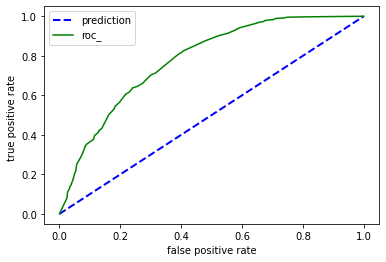

In [223]:
fpr,tpr,thresholds =roc_curve(y_test,y_pred_rcv_pos)
plt.plot([0,1],[0,1],color='blue',label='prediction',linewidth=2,linestyle='--')
plt.xlabel('false positive rate')
plt.plot(fpr,tpr ,color='green',label='roc_')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate ')
plt.legend()
plt.show()

In [224]:
roc_auc_score(y_test,y_pred_rcv_test)

0.6971071182199629

In [226]:
def evaluate_preds(y_test, y_pred_rcv_test):
    """
    Performs evaluation comparison on y_true labels vs. y_pred labels.
    """
    accuracy = accuracy_score(y_test, y_pred_rcv_test)
    precision = precision_score(y_test, y_pred_rcv_test)
    recall = recall_score(y_test, y_pred_rcv_test)
    f1 = f1_score(y_test, y_pred_rcv_test)
    metric_dict = {"accuracy": round(accuracy, 2),
                   "precision": round(precision, 2), 
                   "recall": round(recall, 2),
                   "f1": round(f1, 2)}
    print(f"Acc: {accuracy * 100:.2f}%")
    print(f"Precision: {precision:.2f}")
    print(f"Recall: {recall:.2f}")
    print(f"F1 score: {f1:.2f}")

    return metric_dict

In [232]:
prune_model_randomized = evaluate_preds(y_test, y_pred_rcv_test)

Acc: 69.67%
Precision: 0.68
Recall: 0.71
F1 score: 0.70


# comparing metrics on different models

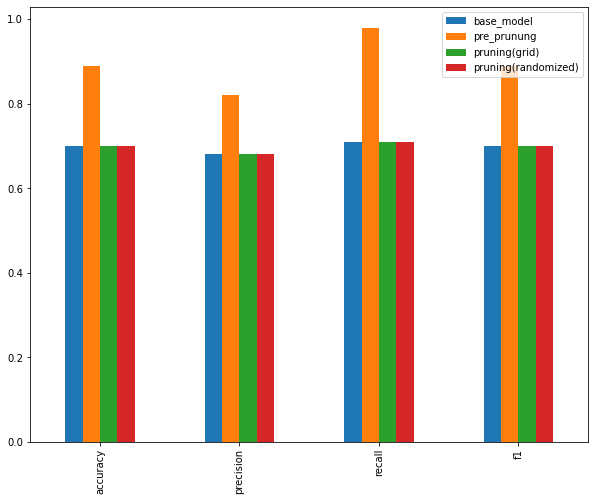

In [233]:
compare_metrics = pd.DataFrame({"base_model": base_model,
                                "pre_prunung": post_pruning_model,
                                "pruning(grid)": prune_model_grid,
                               'pruning(randomized)':prune_model_randomized})
compare_metrics.plot.bar(figsize=(10, 8));

### finally concorodance and rank oredring test results